# <b>Template Matching cho bài toán Lug Detection</b>

# 0. Giới thiệu 
Hiện nay, template matching được ứng dụng rộng rãi trong công nghiệp để giải quyết các bài toán như: đếm số sản phẩm trên băng chuyền, tìm lỗi trên sản phẩm, v.v. Template matching không đòi hỏi cao về phần cứng cũng như độ phức tạp của thuật toán nên tuy đã được ra đời từ lâu nhưng template matching vẫn cho ra hiệu quả tốt trong những bài toán không đòi hỏi cao về tính chính xác của localization.

Trong bài toán lug detection sử dụng template matching, mục tiêu cần phải đạt được là detect đủ các object trong ảnh, chưa nói đến độ chính xác của các bounding box. Có thể thấy, việc áp dụng trực tiếp template matching gần như không thể đạt được yêu cầu khi các object trong ảnh nằm ở các vị trí và góc định hướng ngẫu nhiên. Vì vậy, em đề xuất phương án sau:

1.   Trích đặc trưng SIFT trên ảnh và template
2.   Tiến hành trượt trên ảnh với window cùng kích thước với template. 
3.   Tại mỗi window, match các keypoint của template với ảnh sau đó thực hiện transform để đưa object (nếu có) trong window về đúng định hướng của object trong template. Tính toán correlation coefficient trên mỗi window, nếu giá trị thấp hơn một giá trị ngưỡng thì xem như có object và trả về window tại đó.

Đối với ảnh đầu vào kích thước lớn, để thuật toán hoạt động tốt cần phải thực hiện các phương án tối ưu như sau:


> Ta thấy, dữ liệu của bài toán này khá đơn giản, ảnh là gray scale với background đơn giản, giá trị pixel giữa object và background có sự khác biệt lớn. Do đó, nhờ vào dạng nhị phân của ảnh có thể phân biệt được khá chính xác vùng chứa vật thể và vùng background. Để giảm số sliding window cần tính toán, em bỏ qua những window chứa phần lớn là background dựa trên dạng nhị phân của ảnh.




# 1. Cài đặt OpenCV

In [ ]:
!pip install -U opencv-python

Requirement already up-to-date: opencv-python in /usr/local/lib/python3.7/dist-packages (4.5.1.48)


In [ ]:
from google.colab import drive
drive.mount('./gdrive')

Drive already mounted at ./gdrive; to attempt to forcibly remount, call drive.mount("./gdrive", force_remount=True).


In [ ]:
import os

ROOT_PATH = '/content/gdrive/MyDrive/AI INSIGHT 2020/W10'
if os.getcwd() != ROOT_PATH:
    os.chdir(ROOT_PATH)

import time
import math
import random
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity
from scipy.stats.stats import pearsonr
import cv2

# SET SEED
random.seed(10)
np.random.seed(10)

# 2. Biểu diễn ảnh và template với SIFT

Text(0.5, 1.0, 'Shape of the second image: (1200, 1600, 3)')

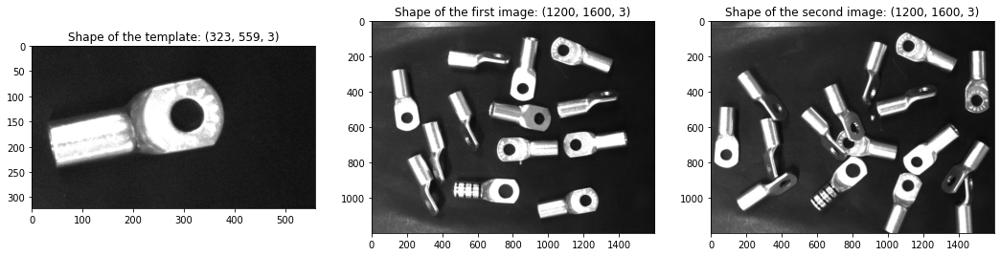

In [ ]:
template = plt.imread('/content/gdrive/MyDrive/AI INSIGHT 2020/W10/Template_lug.png')
image1 = plt.imread('/content/gdrive/MyDrive/AI INSIGHT 2020/W10/Image_lug1.jpg')
image2 = plt.imread('/content/gdrive/MyDrive/AI INSIGHT 2020/W10/Image_lug2.jpg')

# Convert to [0...255] values
template = (template * 255).astype(np.uint8)

# Convert to gray scale
template_gray = cv2.cvtColor(template, cv2.COLOR_RGB2GRAY)
image1_gray = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
image2_gray = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

# Visualize
fig = plt.figure(figsize=(18, 6))

ax1 = fig.add_subplot(131)
ax1.imshow(template)
ax1.set_title('Shape of the template: {}'.format(template.shape))

ax2 = fig.add_subplot(132)
ax2.imshow(image1)
ax2.set_title('Shape of the first image: {}'.format(image1.shape))

ax3 = fig.add_subplot(133)
ax3.imshow(image2)
ax3.set_title('Shape of the second image: {}'.format(image2.shape))

Text(0.5, 1.0, 'Keypoints on the second image')

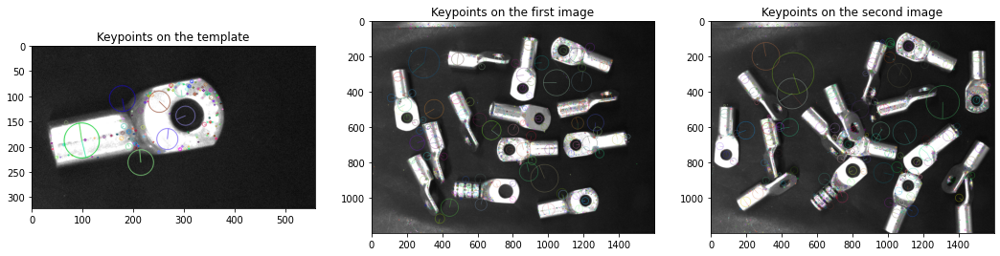

In [ ]:
feature_extractor = cv2.SIFT_create()

# Find the keypoints and descriptors
kp_template, desc_template = feature_extractor.detectAndCompute(template_gray, None)
kp_img1, desc_img1 = feature_extractor.detectAndCompute(image1_gray, None)
kp_img2, desc_img2 = feature_extractor.detectAndCompute(image2_gray, None)

# Draw keypoints
draw_kp_template = cv2.drawKeypoints(
    template, 
    kp_template, 
    None, 
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
    )

draw_kp_img1 = cv2.drawKeypoints(
    image1, 
    kp_img1, 
    None, 
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
    )

draw_kp_img2 = cv2.drawKeypoints(
    image2, 
    kp_img2, 
    None, 
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
    )

# Visualize
fig = plt.figure(figsize=(18, 6))

ax1 = fig.add_subplot(131)
ax1.imshow(draw_kp_template)
ax1.set_title('Keypoints on the template')

ax2 = fig.add_subplot(132)
ax2.imshow(draw_kp_img1)
ax2.set_title('Keypoints on the first image')

ax3 = fig.add_subplot(133)
ax3.imshow(draw_kp_img2)
ax3.set_title('Keypoints on the second image')

# 3. Thực hiện match các keypoint trên template với ảnh

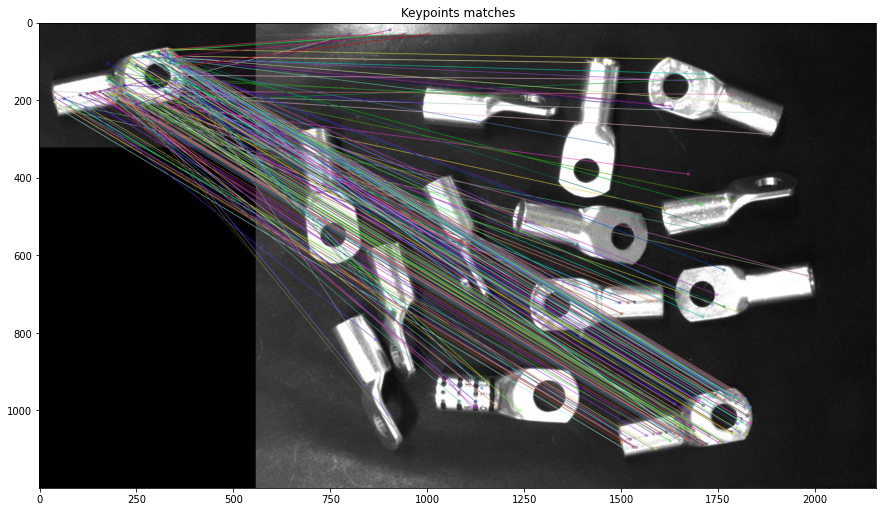

In [ ]:
bf = cv2.BFMatcher()
matches = bf.knnMatch(desc_template, desc_img1, k=2)

# Apply ratio test
good_match = []
for m in matches:
    if m[0].distance/m[1].distance < 0.5:
        good_match.append(m)
good_match_arr = np.asarray(good_match)

# Show matches
im_matches = cv2.drawMatchesKnn(template, kp_template, image1, kp_img1,
                                good_match, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(15, 15))
plt.imshow(im_matches)
plt.title("Keypoints matches")
plt.show()

0.5966854166666666

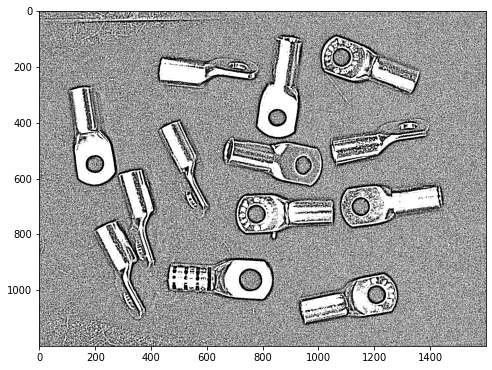

In [ ]:
img_bin = cv2.adaptiveThreshold(
            image1_gray, 
            255, 
            cv2.ADAPTIVE_THRESH_MEAN_C, 
            cv2.THRESH_BINARY,
            11,
            2
            )
img_bin = img_bin / 255
plt.figure(figsize=(8, 8))
plt.imshow(img_bin, cmap='gray')
np.mean(img_bin)

# 4. Tạo class detect

In [ ]:
class Detector():
    def __init__(self, img, template):
        self.template = template
        self.template_w = self.template.shape[1]
        self.template_h = self.template.shape[0]

        self.img = img
        self.w = self.img.shape[1]
        self.h = self.img.shape[0]

        # Convert to integer values of [0, 255] range
        if self.img != np.uint8 and np.max(self.img) != 255:
            self.img = (self.img * 255).astype(np.uint8)
        if self.template != np.uint8 and np.max(self.template) != 255:
            self.template = (self.template * 255).astype(np.uint8)

        # Convert to gray scale
        self.img_gray = cv2.cvtColor(self.img, cv2.COLOR_RGB2GRAY)
        self.template_gray = cv2.cvtColor(self.template, cv2.COLOR_RGB2GRAY)
        
        # Convert to binary image with Adaptive Thresholding
        self.img_bin = cv2.adaptiveThreshold(
            self.img_gray, 
            255, 
            cv2.ADAPTIVE_THRESH_MEAN_C, 
            cv2.THRESH_BINARY,
            11,
            2
            )
        self.img_bin = self.img_bin / 255

        # Initialize the extractor
        self.feature_extractor = cv2.SIFT_create()
        
        # Extract keypoints and descriptors in the template
        self.extract_keypoints()

        self.sim_data = []

        # Save bounding boxes with a format of [xmin, ymin, xmax, ymax]
        self.bboxes = []

        # Save matched keypoints with a format of [`matched_kp_array`, ...]
        self.matched_kps = []


    def extract_keypoints(self, window=None):
        '''
        `window`: a tuple/list of 2 elements specifying top left corner coordinate 
                of the window being concentrated, (xmin, ymin) 
                (width and height of every windows is constant)
        '''

        # Extract keypoints and descriptors in the template
        self.template_kp, self.template_desc = self.feature_extractor.detectAndCompute(
            self.template_gray, 
            None
            )
        
        self.template_draw_kp = cv2.drawKeypoints(
                self.template, 
                self.template_kp, 
                None, 
                flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
                )

        # Extract keypoints and descriptors in the window (if provided)
        if window is not None:
            (i, j) = window
            kp, desc = self.feature_extractor.detectAndCompute(
                self.img_gray[j:j+self.template_h, i:i+self.template_w], 
                None
                )
            
            draw_kp = cv2.drawKeypoints(
                self.img[j:j+self.template_h, i:i+self.template_w], 
                kp, 
                None, 
                flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
                )
            
            return kp, desc, draw_kp
            

    def match_and_warp(self, window=None, min_matches=None, show_matches=False):
        '''
        `window`: a tuple/list of 2 elements specifying top left corner coordinate 
                of the window being concentrated, (xmin, ymin) 
                (width and height of every windows is constant)
        '''

        if window is not None:
            # Implement on the window
            (i, j) = window

            # Extract keypoints and descriptors
            kp, desc, draw_kp = self.extract_keypoints(window)

            # Matcher
            bf = cv2.BFMatcher()
            matches = bf.knnMatch(self.template_desc, desc, k=2)

            # Apply ratio test
            good_match = []
            # for m in matches:
            #     if m[0].distance/m[1].distance < 0.7:
            #         good_match.append(m)
            good_match = matches[:10]
            good_match_arr = np.asarray(good_match)
            

            # SKIP CONDITIONS
            # In case do not meet the required number of matching points
            if len(good_match) < min_matches:
                print('Matching points do not meet the required number. Ignored at {}'.format((i, j)))
                return None, None


            # Obtain matches
            im_matches = cv2.drawMatchesKnn(
                self.template, 
                self.template_kp, 
                self.img[j:j+self.template_h, i:i+self.template_w], 
                kp, 
                good_match, 
                None, 
                flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
                )
            
        if show_matches:
            plt.figure(figsize=(20, 20))
            plt.imshow(im_matches)
            plt.title("Keypoints matches")
            plt.show()

        # Find homography between template and window
        good_kp_window = np.array([kp[m.trainIdx].pt for m in good_match_arr[:, 0]]).reshape(-1, 1, 2)
        good_kp_template = np.array([self.template_kp[m.queryIdx].pt for m in good_match_arr[:, 0]]).reshape(-1, 1, 2)
        H, masked = cv2.findHomography(good_kp_window, good_kp_template, cv2.RANSAC, 5.0)
        
        # Warp window to template
        window_warped = cv2.warpPerspective(
            self.img[j:j+self.template_h, i:i+self.template_w], 
            H, 
            (self.template_w, self.template_h)
            )
        plt.imshow(window_warped)
        return window_warped, good_kp_window


    def predict(self, step=5, min_matches=5, method='correlation', threshold=0.6, show_matches=False):
        '''
        parameters:
            `method`: a string refer to a method which is use for compute similarity,
                    'abs', 'cosine', 'correlation'.

        return:
            a numpy array of bounding boxes detected.
        '''
        j = 0

        while j <= self.h-self.template_h:
            i = 0
            while i <= self.w-self.template_w:
                # Check for whether or not background is dominating
                # if np.mean(self.img_bin[j:j+self.template_h, i]) < 0.2:
                #     i += step
                #     continue

                # Apply matching and warping
                window_warped, good_kp_window = self.match_and_warp(
                    window=(i, j), 
                    min_matches=min_matches,
                    show_matches=show_matches
                    )

                if window_warped is None:
                    # Skip when receive invalid matches
                    i += step
                    continue
                else:
                    # Compute similarity
                    if method == 'abs':
                        score = np.sum(np.absolute(self.template - window))
                        self.sim_data.append((score, i, j))

                    elif method == 'cosine':
                        score = cosine_similarity(
                            np.reshape(window_warped, (1, -1)), 
                            np.reshape(self.template, (1,-1))
                            )
                        score = score[0][0]
                        self.sim_data.append((score, i, j))
                        
                    elif method == 'correlation':
                        score, p_value = pearsonr(
                            np.reshape(window_warped, (1, -1)), 
                            np.reshape(self.template, (1,-1))
                            )
                        self.sim_data.append((score, i, j))
                    
                    # print((score, i, j))

                    # Evaluation
                    if method == 'abs':
                        if score < threshold:
                            self.bboxes.append([i, j, i+self.template_w, j+self.template_h])
                            self.matched_kps.append(good_kp_window)
                            print('Detected object at {}'.format(i, j, i+self.template_w, j+self.template_h))

                    elif method == 'correlation' or method == 'cosine':
                        if score > threshold:
                            self.bboxes.append([i, j, i+self.template_w, j+self.template_h])
                            self.matched_kps.append(good_kp_window)
                            print('Detected object at {}'.format(i, j, i+self.template_w, j+self.template_h))
                i += step

            j += step



In [ ]:
detector = Detector(image1, template)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  


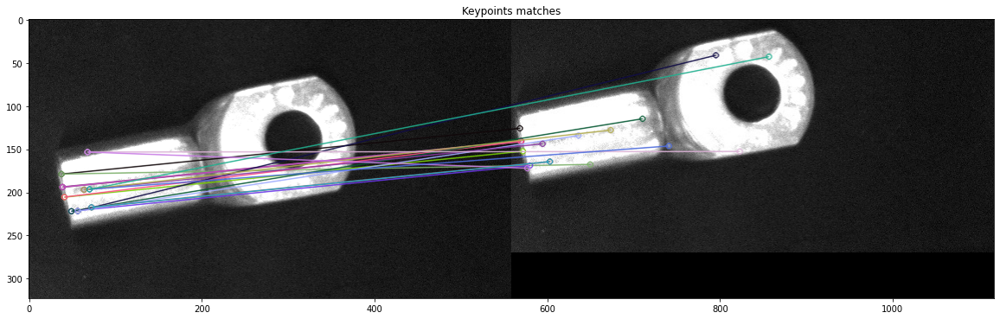

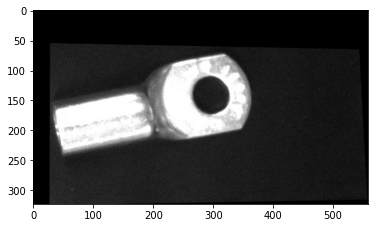

In [ ]:
window_warped, good_kp_window = detector.match_and_warp((930, 930), min_matches=5, show_matches=True)

In [ ]:
np.reshape(window_warped, (1, -1))

array([[ 54,  54,  54, ..., 243, 243, 243]], dtype=uint8)

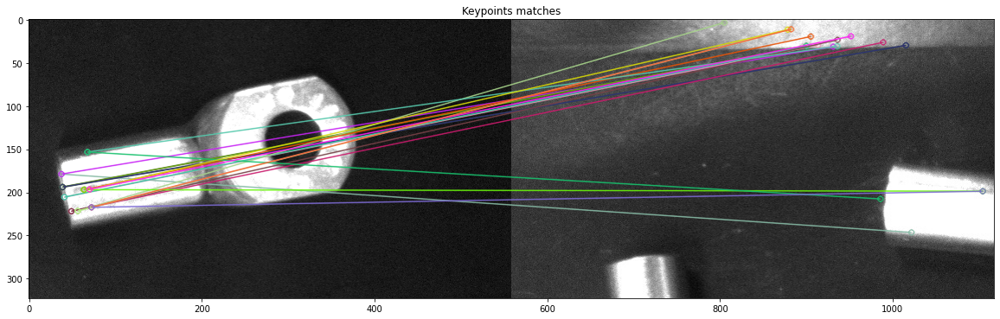

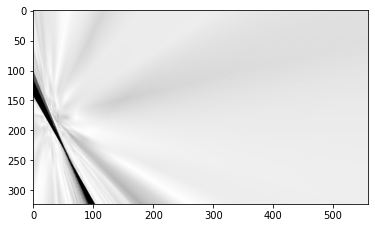

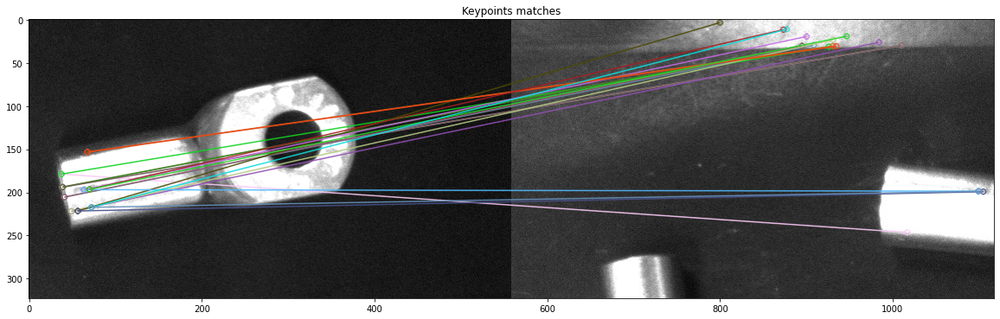

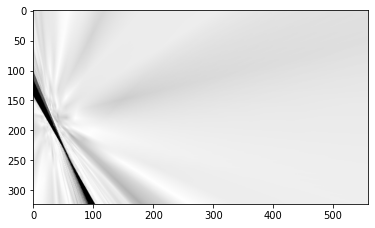

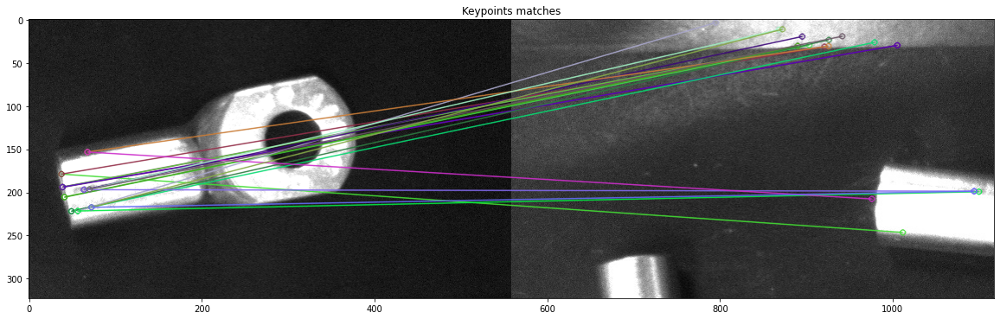

...

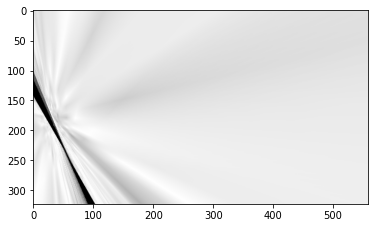

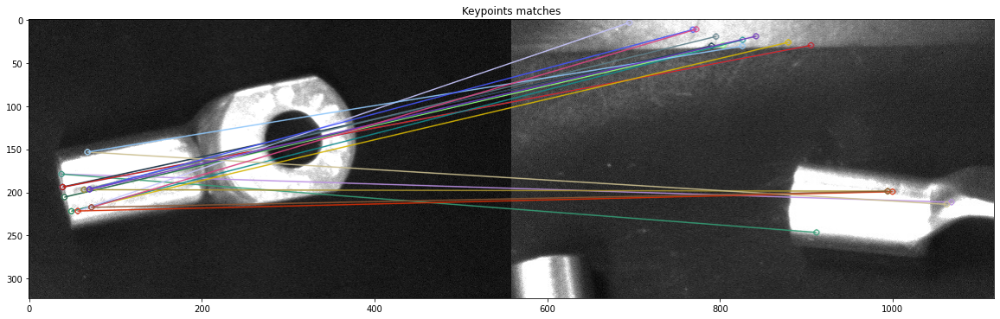

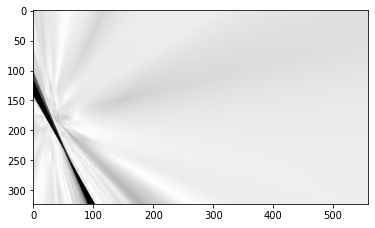

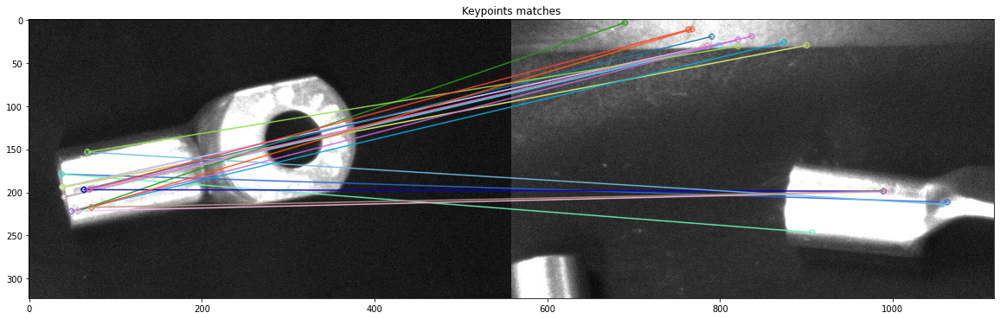

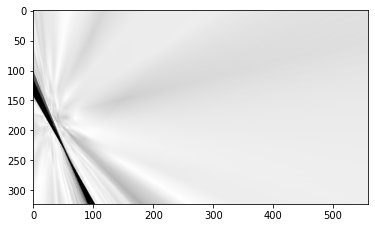

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py", line 2882, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-13-6fe371d7c321>", line 6, in <module>
    show_matches=True
  File "<ipython-input-9-ac076d14da9c>", line 174, in predict
    show_matches=show_matches
  File "<ipython-input-9-ac076d14da9c>", line 134, in match_and_warp
    plt.show()
  File "/usr/local/lib/python3.7/dist-packages/matplotlib/pyplot.py", line 272, in show
    return _show(*args, **kw)
  File "/usr/local/lib/python3.7/dist-packages/ipykernel/pylab/backend_inline.py", line 39, in show
    metadata=_fetch_figure_metadata(figure_manager.canvas.figure)
  File "/usr/local/lib/python3.7/dist-packages/IPython/core/display.py", line 306, in display
    format_dict, md_dict = format(obj, include=include, exclude=exclude)
  File "/usr/local/lib/python3.7/dist-packages/IPython/core/formatters.py", line 173, in format

KeyboardInterrupt: ignored

In [ ]:
detector.predict(
    step=5, 
    min_matches=1, 
    method='consine', 
    threshold=0.2, 
    show_matches=True
    )

## Một số vấn đề:
Đặc trưng SIFT thể hiện chưa tốt nên việc match các keypoint trên template với window chưa chính xác. Với cách tiếp cận thuần thị giác máy như trên, mô hình chưa đủ robust đối với nhiễu của background. Đồng thời, sử dụng window bằng với kích thước template khó detect các vật có hướng dọc.